In [9]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import hdbscan
from sklearn.manifold import TSNE

import sys

sys.path.append("../scripts")
from data import SmallPatchesDataset, get_filenames
from models import AutoEncoder

# autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
filenames = get_filenames(100)

In [4]:
dataset = SmallPatchesDataset(filenames)
dl = torch.utils.data.DataLoader(dataset, batch_size = 64)

In [7]:
latent_dim = 100
model = AutoEncoder(latent_dim, encoder_arch= "resnet50", decoder_layers_per_block = [3] * 5)
model.load_state_dict(torch.load(f"../models/AE_resnet50/model.pt"));

In [8]:
device = torch.device("cuda")
model.to(device)
embeddings = []
for batch, _ in tqdm(dl):
    batch = batch.to(device)
    batch_size = batch.shape[0]
    z = model(batch)[0].detach().cpu().numpy().reshape(batch_size, -1)
    embeddings.append(z)
embeddings = np.concatenate(embeddings)

  0%|          | 0/625 [00:00<?, ?it/s]/home/giovani/miniconda3/envs/urban_gdp/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
100%|██████████| 625/625 [02:49<00:00,  3.69it/s]


In [10]:
embeddings_sample = embeddings[:10000, :]

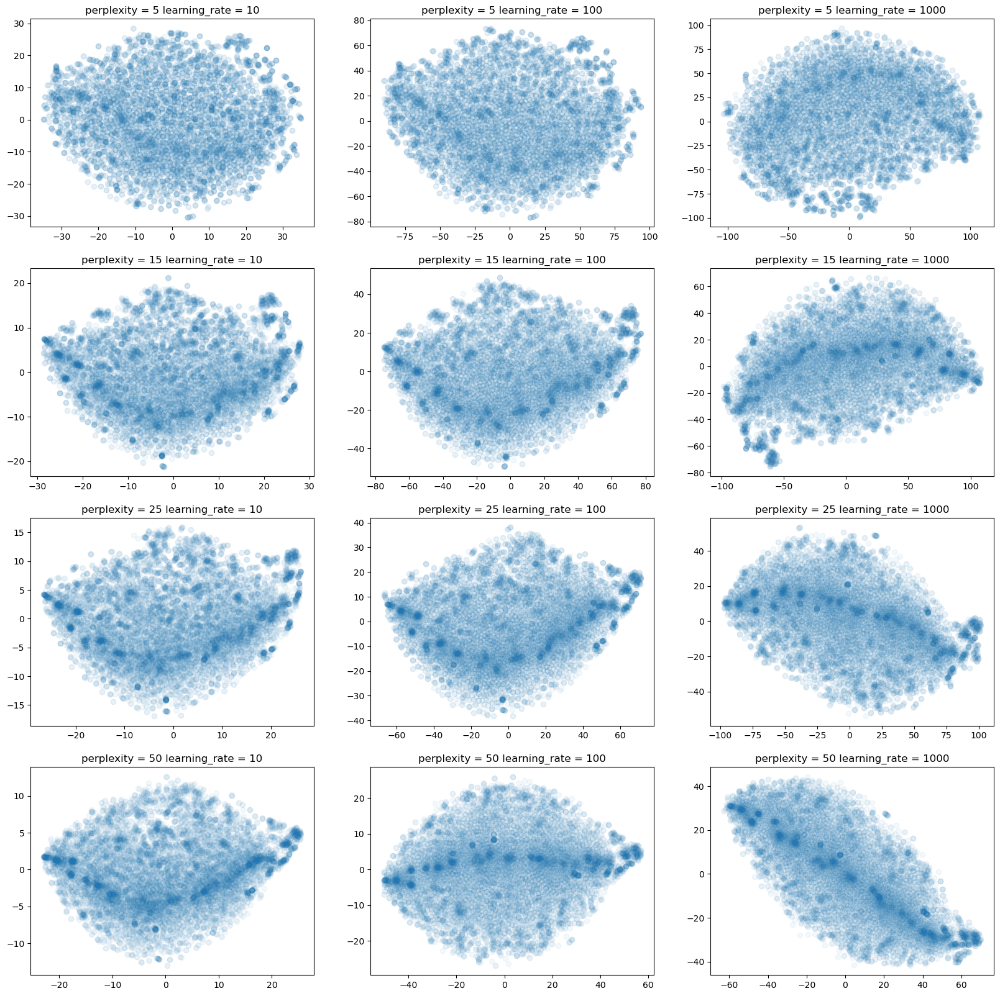

In [11]:
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (20, 20))
for i, perplexity in enumerate([5, 15, 25, 50]):
    for j, learning_rate in enumerate([10, 100, 1000]):
        embeddings_proj = TSNE(perplexity=perplexity, learning_rate=learning_rate).fit_transform(embeddings_sample)
        axs[i, j].scatter(embeddings_proj[:, 0], embeddings_proj[:, 1], alpha = 0.05)
        axs[i, j].set_title(f"perplexity = {perplexity} learning_rate = {learning_rate}")

plt.show()

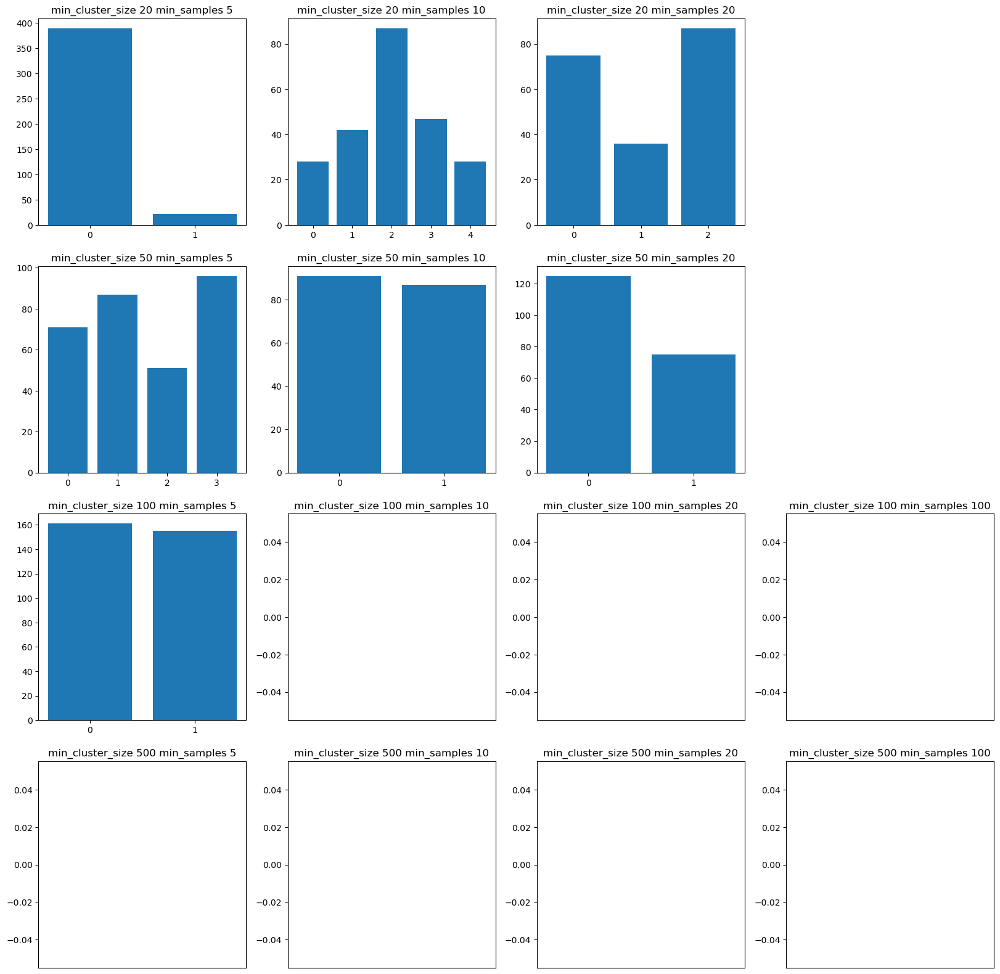

In [12]:
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (20, 20))
for i, min_cluster_size in enumerate([20, 50, 100, 500]):
    for j, min_samples in enumerate([5, 10, 20, 100]):
        if min_samples > min_cluster_size:
            axs[i, j].set_axis_off()
            continue
        cls = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
        cls.fit(embeddings_sample)
        
        axs[i, j].set_title(f"min_cluster_size {min_cluster_size} min_samples {min_samples}")
        height, x = np.histogram(cls.labels_, bins = np.arange(cls.labels_.max() + 2))
        axs[i, j].bar(x = x[:-1], height = height)
        axs[i, j].set_xticks(x[:-1])
        axs[i, j].set_xticklabels(x[:-1].astype(int))
plt.show()

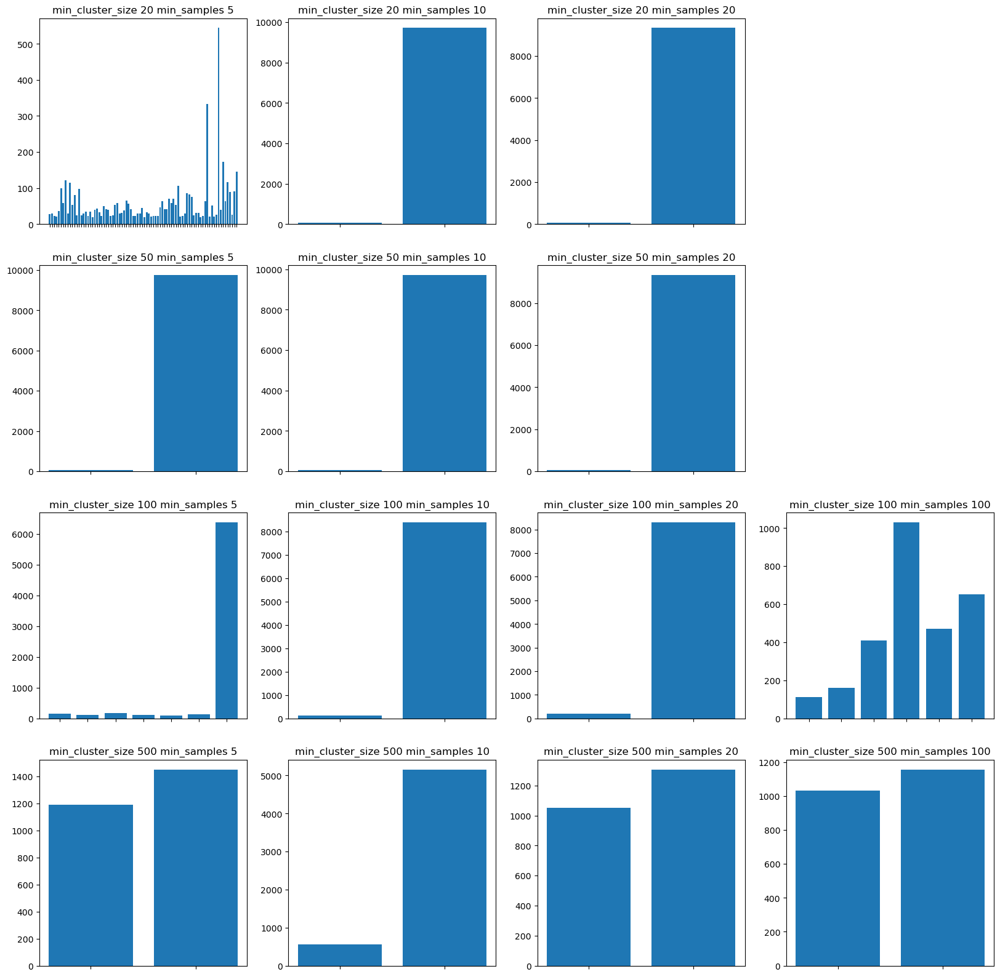

In [13]:
embeddings_proj = TSNE(n_components=2).fit_transform(embeddings_sample)
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (20, 20))
for i, min_cluster_size in enumerate([20, 50, 100, 500]):
    for j, min_samples in enumerate([5, 10, 20, 100]):
        if min_samples > min_cluster_size:
            axs[i, j].set_axis_off()
            continue
        cls = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
        cls.fit(embeddings_proj)
        
        axs[i, j].set_title(f"min_cluster_size {min_cluster_size} min_samples {min_samples}")
        height, x = np.histogram(cls.labels_, bins = np.arange(cls.labels_.max() + 2))
        axs[i, j].bar(x = x[:-1], height = height)
        axs[i, j].set_xticks(x[:-1])
        axs[i, j].set_xticklabels(["" for _ in x[:-1]])
       
plt.show()

In [14]:
def plot_sample(sample, ax = None):
    img = sample
    img = img.permute(1, 2, 0).detach().cpu().numpy()
    if ax is None:
        plt.imshow(img)
        plt.axis(False)
        plt.show()
    else:
        ax.imshow(img)
        
def visualize_cluster_samples(k, clusters, n_samples = 9):
    ncols = 5
    nrows = k // 5 + (k % 5 > 0)
    fig, axs = plt.subplots(nrows = nrows, ncols = ncols, figsize = (ncols * 4, nrows * 4))
    axs = axs.flat
    [ax.set_axis_off() for ax in axs]

    for i in range(k):
        axs[i].set_title(f"Samples of cluster {i}")
        samples = clusters == i
        if samples.sum() == 0:
            continue
        
        random_sample = np.random.choice(np.where(samples)[0], min(n_samples, samples.sum()))
        samples_per_row = int(np.sqrt(n_samples))
        img = torch.zeros((3, 224 * samples_per_row, 224 *samples_per_row))
        for j, idx in enumerate(random_sample):
            img[:, (j // samples_per_row) * 224: (j // samples_per_row + 1) * 224, (j % samples_per_row) * 224: (j % samples_per_row + 1) * 224] = dataset[idx][0]

        plot_sample(img, axs[i])
    plt.suptitle(f"Samples with k = {k}")


/home/giovani/miniconda3/envs/urban_gdp/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


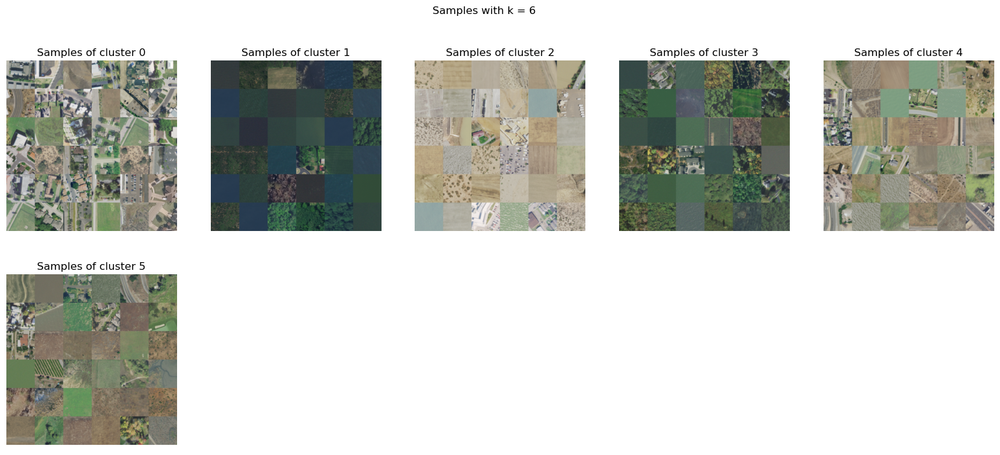

In [16]:
cls = hdbscan.HDBSCAN(min_cluster_size=100, min_samples=100)
cls.fit(embeddings_proj)

visualize_cluster_samples(cls.labels_.max() + 1, cls.labels_, n_samples = 36)

/home/giovani/miniconda3/envs/urban_gdp/lib/python3.9/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


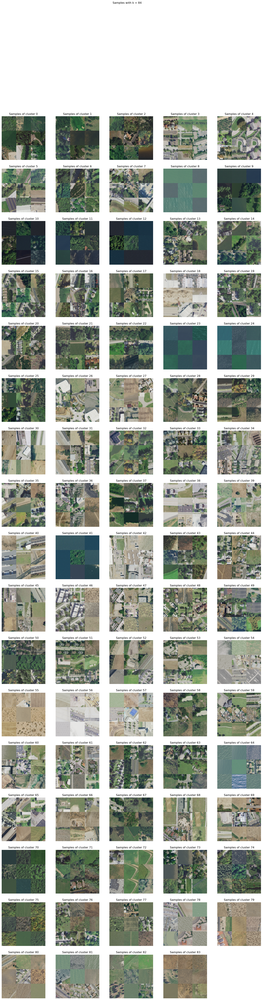

In [17]:
cls = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=5)
cls.fit(embeddings_proj)

visualize_cluster_samples(cls.labels_.max() + 1, cls.labels_, n_samples = 9)